In [1]:
import xarray as xr
from glob import glob
import os
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import warnings
warnings.simplefilter("ignore") 
warnings.filterwarnings('always')

In [ ]:
# allfiles = glob('/glade/u/home/abukowski/scratch/simstorm-20110521/FullStorm/GITM*.nc')
# allfiles = np.sort(allfiles)
ds = xr.open_mfdataset('/glade/u/home/abukowski/scratch/simstorm-20110521/FullStorm/GITM*.nc')

<frozen importlib._bootstrap>:241: RuntimeWarning: numpy.ndarray size changed, may indicate binary incompatibility. Expected 16 from C header, got 96 from PyObject


In [ ]:
ds.VerticalTEC.shape, ds.Rho.shape

((625, 90, 180), (625, 90, 180, 50))

In [ ]:
ds.VerticalTEC

/glade/work/abukowski/conda-envs/simstorm/lib/python3.11/site-packages/xarray/core/formatting_html.py:26: DeprecationWarning: read_binary is deprecated. Use files() instead. Refer to https://importlib-resources.readthedocs.io/en/latest/using.html#migrating-from-legacy for migration advice.
  read_binary(package, resource).decode("utf-8")
/glade/work/abukowski/conda-envs/simstorm/lib/python3.11/site-packages/xarray/core/formatting_html.py:26: DeprecationWarning: read_binary is deprecated. Use files() instead. Refer to https://importlib-resources.readthedocs.io/en/latest/using.html#migrating-from-legacy for migration advice.
  read_binary(package, resource).decode("utf-8")


<xarray.DataArray 'VerticalTEC' (time: 625, lon: 90, lat: 180)>
dask.array<concatenate, shape=(625, 90, 180), dtype=float64, chunksize=(1, 90, 180), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2011-05-20 ... 2011-05-22T04:00:00
  * lon      (lon) float64 2.0 6.0 10.0 14.0 18.0 ... 346.0 350.0 354.0 358.0
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Ao

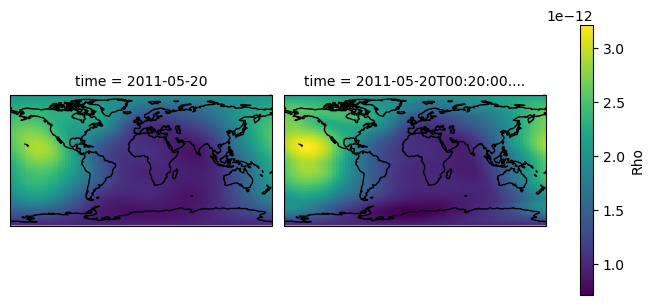

In [ ]:
# ax = plt.subplot(projection=ccrs.PlateCarree())

p = ds.Rho.sel(alt=450, method='nearest').isel(time=[0,4]).plot(
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree()},
    col='time', x = 'lon',y='lat')

for ax in p.axs.flatten():
    ax.coastlines()

plt.show()

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 2:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 2:
  #000: H5A.c line 528 in H5Ao

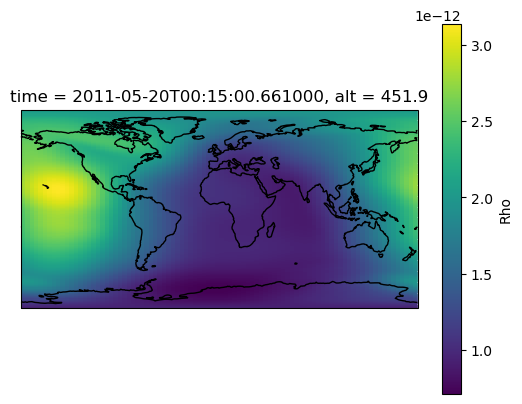

In [ ]:
p = ds.Rho.sel(alt=450, method='nearest').isel(time=3).plot(
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree()},
    x = 'lon',y='lat')

p.axes.coastlines()

plt.show()

In [12]:
ds

<xarray.Dataset>
Dimensions:                          (time: 625, lon: 90, lat: 180, alt: 50)
Coordinates:
  * time                             (time) datetime64[ns] 2011-05-20 ... 201...
  * lon                              (lon) float64 2.0 6.0 10.0 ... 354.0 358.0
  * lat                              (lat) float64 -89.5 -88.5 ... 88.5 89.5
  * alt                              (alt) float64 100.0 101.7 ... 729.0 751.5
Data variables: (12/49)
    LocalTime                        (time, lon, lat) float64 dask.array<chunksize=(1, 90, 180), meta=np.ndarray>
    SolarZenithAngle                 (time, lon, lat) float64 dask.array<chunksize=(1, 90, 180), meta=np.ndarray>
    VerticalTEC                      (time, lon, lat) float64 dask.array<chunksize=(1, 90, 180), meta=np.ndarray>
    AltIntJouleHeating_W_m2          (time, lon, lat) float64 dask.array<chunksize=(1, 90, 180), meta=np.ndarray>
    AltIntHeatingTransfer_W_m2       (time, lon, lat) float64 dask.array<chunksize=(1, 90, 180), meta=np.ndarray>
    AltIntEuvHeating_W_m2            (time, lon, lat) float64 dask.array<chunksize=(1, 90, 180), meta=np.ndarray>
    ...                               ...
    e_                               (time, lon, lat, alt) float64 dask.array<chunksize=(1, 90, 180, 50), meta=np.ndarray>
    eTemperature                     (time, lon, lat, alt) float64 dask.array<chunksize=(1, 90, 180, 50), meta=np.ndarray>
    iTemperature                     (time, lon, lat, alt) float64 dask.array<chunksize=(1, 90, 180, 50), meta=np.ndarray>
    Vi_east                          (time, lon, lat, alt) float64 dask.array<chunksize=(1, 90, 180, 50), meta=np.ndarray>
    Vi_north                         (time, lon, lat, alt) float64 dask.array<chunksize=(1, 90, 180, 50), meta=np.ndarray>
    Vi_up                            (time, lon, lat, alt) float64 dask.array<chunksize=(1, 90, 180, 50), meta=np.ndarray>
Attributes:
    version:              21.14
    dropped-ghost-cells:  False
    with_time:            True

In [8]:
from utility_programs.filters import make_fits

In [9]:
# ds2 = ds.apply(make_fits, compute=False);

In [10]:
def percent_diff(ds):
    
    ds2 = ds.apply(make_fits)
    
    return 100 * (ds - ds2) / ds

In [ ]:
ds2 = percent_diff(ds)

/glade/scratch/abukowski/ipykernel_19143/1846390154.py:3: PendingDeprecationWarning: Dataset.apply may be deprecated in the future. Using Dataset.map is encouraged
  ds2 = ds.apply(make_fits)
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 3:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't loc

In [ ]:
ds2.to_netcdf('/glade/u/home/abukowski/scratch/simstorm-20110521/FullStorm/GITM_bandpass.nc')